In [1]:
# Data manipulation 
import pandas as pd 
import numpy as np
import os

# Data viz
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

In [2]:
# load data 
df  = pd.read_parquet("../bldb/clean/csv/bldb_dset.parquet")
sbl = df[df.bla_class.str.contains("class_a|class_c|class_d")]
mbl = df[df.bla_class.str.contains("class_b1|class_b2|class_b3")]

# load tsne
tsne_sbl = pd.read_parquet("../bldb/lowdim/tsne/csv/tsne_sbl_all_models.csv")
tsne_mbl = pd.read_parquet("../bldb/lowdim/tsne/csv/tsne_mbl_all_models.csv")

# merge 
sbl = sbl.merge(tsne_sbl, on="seq_id", how="inner")
mbl = mbl.merge(tsne_mbl, on="seq_id", how="inner")

# split
sbl_a = sbl[sbl.bla_class == "class_a"]
sbl_c = sbl[sbl.bla_class == "class_c"]
sbl_d = sbl[sbl.bla_class == "class_d"]
mbl_me = mbl[mbl.bla_class.str.contains("class_b3")]
mbl_mb = mbl[~mbl.bla_class.str.contains("class_b3")]

# print info
print(sbl.columns.to_list())

# a plot fx 
def do_iscatter(df, x, y, hue, hover_name, hover_data):

    # plot
    fig = px.scatter(df, x=x, y=y,
    height=700, width=800, color=hue,
    hover_name=hover_name, 
    color_discrete_sequence=px.colors.qualitative.Plotly,
    hover_data=hover_data
    )

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

['#name', 'seq', 'length', 'filename', 'bla_class', 'protein_name', 'protein_family_filename', 'superfamily', 'protein_family', 'top_fam', 'seq_id', 'ambler_class', 'alternative_protein_name', 'subfamily', 'genpept_id', 'genbank_id', 'pubmed_id', 'seq_url', 'pdb_structures', 'mutants', 'phenotype', 'functional_info', 'source', 'bitscore', 'Domain', 'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species', 'phylo_group', 'phylo_group_genus', 'phylo_group_sp', 'bla_subclass', 'esm1b', 'esm2_650m', 'esm2_3b', 'carp', 't5xlu50', 'molecular_weight', 'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy', 'helix', 'turn', 'sheet', 'pass_the_filter', 'is_clust_rep_30', 'is_clust_rep_60', 'is_clust_rep_90', 'has_af2_model', 'model', 'mean_plddt', 'resid_plddt', 'entryId', 'gene', 'uniprotAccession', 'uniprotId', 'uniprotDescription', 'taxId', 'organismScientificName', 'uniprotStart', 'uniprotEnd', 'modelCreatedDate', 'latestVersion', 'allVersions', 'isReviewed', 'isReferenceProt

In [3]:
# remove outliers 
sbl_a  = sbl_a[(sbl_a.tsne1_esm1b_400.between(-80,30))]
sbl_d  = sbl_d[(sbl_d.tsne1_esm1b_400.between(-40,30))]
mbl_me = mbl_me[(mbl_me.tsne1_esm1b_400.between(0,40))]

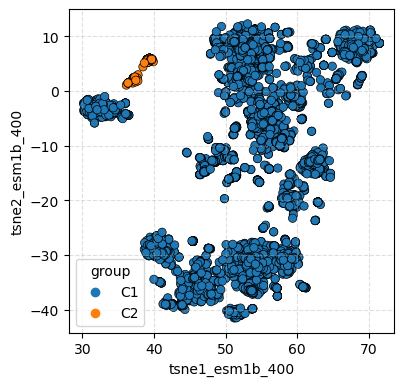

In [11]:
sbl_c2 = sbl_c.copy()

conditions = [
    (sbl_c2.tsne1_esm1b_400.between(36,40) & sbl_c2.tsne2_esm1b_400.between(0, 8)),   
]

values = ["C2"]

sbl_c2["group"] = np.select(conditions, values)
sbl_c2["group"] = sbl_c2["group"].str.replace("0", "C1")


plt.figure(figsize=(4.2,4.2))
ax=sns.scatterplot(sbl_c2, x="tsne1_esm1b_400", y="tsne2_esm1b_400", hue="group",alpha=1, edgecolor = "black", palette="tab10")
ax.grid(alpha=0.4, linestyle="--")

In [12]:
sbl_c2 = sbl_c2[sbl_c2.group =="C2"]
len(sbl_c2)

160

In [8]:
def custom_plot(data, x, y, col, colors, frame_color):
    
    # get most abundant cats 
    top = data[col].value_counts().nlargest(9).index
    data['top'] = data[col].apply(lambda x: x if x in top else 'no top')
    
    # sort 
    ordered_categories = data['top'].value_counts().index
    data = data.set_index('top').loc[ordered_categories].reset_index()

    # plot 
    plt.figure(figsize=(5,5))
    ax = sns.scatterplot(data=data, x=x, y=y, hue="top", palette=colors, edgecolor="none", alpha=0.9)
    
    # legend 
    h, l = ax.get_legend_handles_labels()
    counts = data["top"].value_counts().reindex(l)
    l = [f'{yn} ({c})' for yn,c in counts.items()]

    # axis
    ax.legend(h,l, frameon=False,  bbox_to_anchor=(0.97, 1.03), loc='upper left')
    ax.grid(alpha=0.2, linestyle='--')
    ax.set_axisbelow(True)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.set_ylabel("")
    ax.set_xlabel("")
    ax.tick_params(axis='both', colors='w')
    ax.set_title(col)
    for spine in ax.spines.values():
        spine.set_edgecolor(frame_color)
    plt.show()

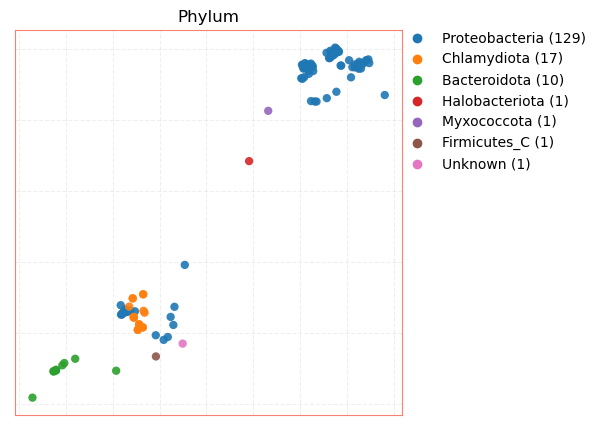

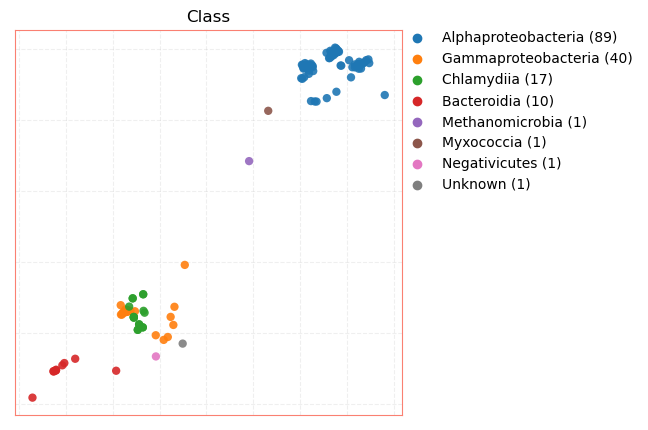

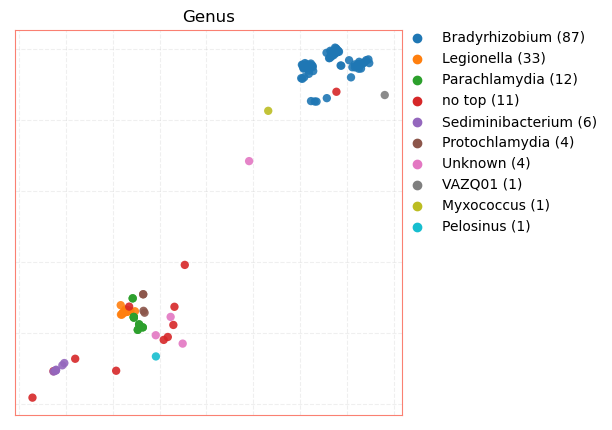

In [9]:
custom_plot(sbl_c2, "tsne1_esm1b_400", "tsne2_esm1b_400", "Phylum", "tab10", 'salmon')
custom_plot(sbl_c2, "tsne1_esm1b_400", "tsne2_esm1b_400", "Class", "tab10", 'salmon')
custom_plot(sbl_c2, "tsne1_esm1b_400", "tsne2_esm1b_400", "Genus", "tab10", 'salmon')

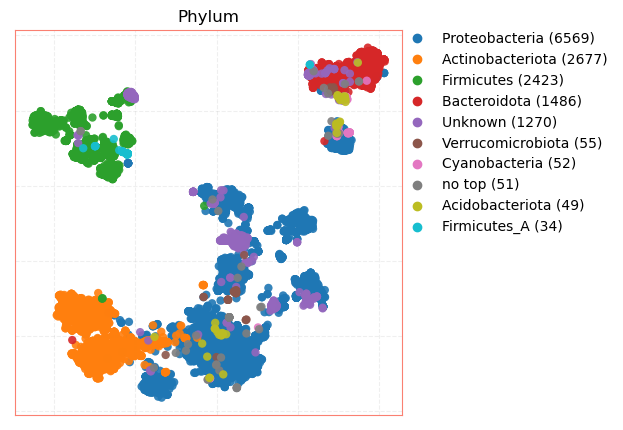

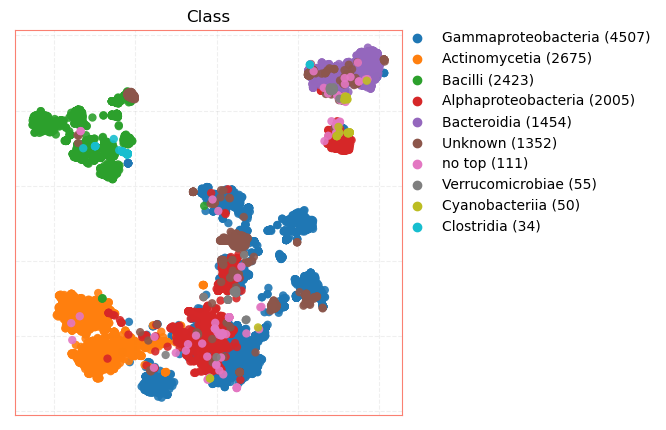

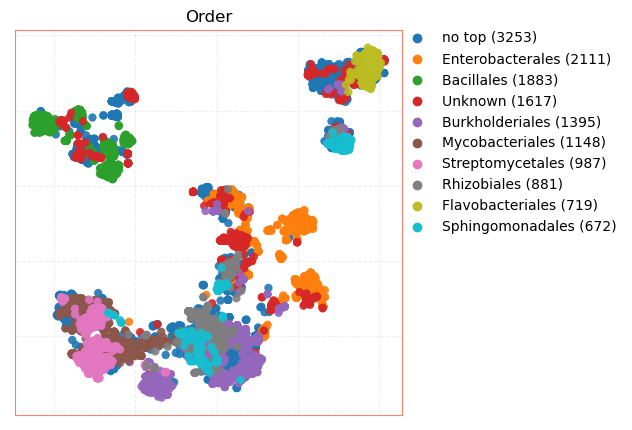

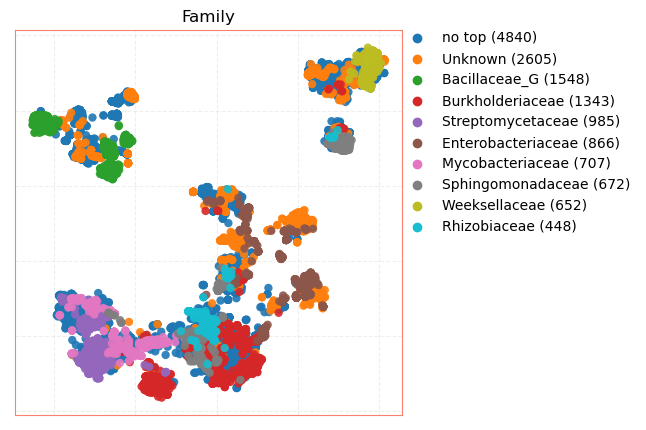

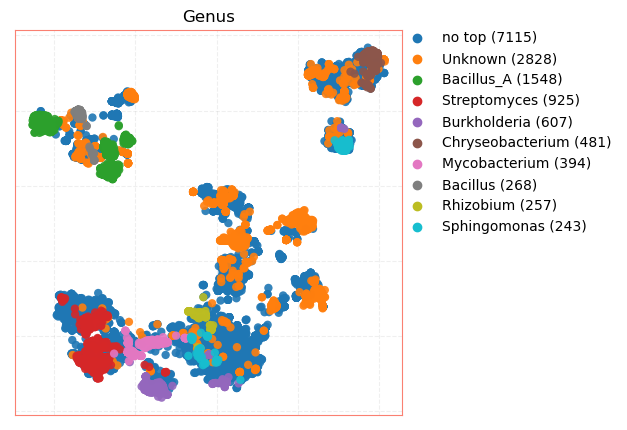

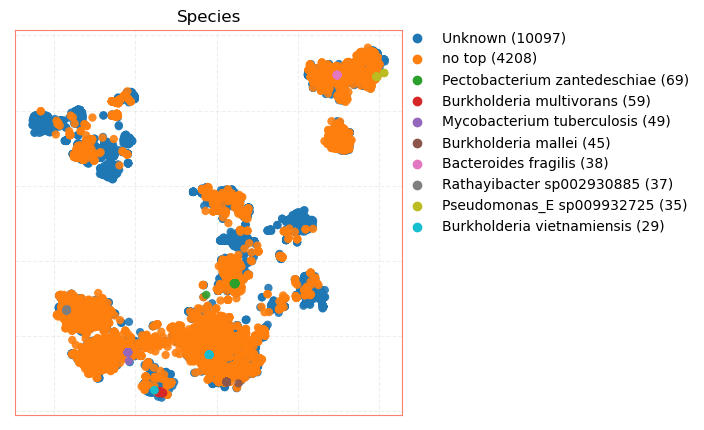

In [12]:
custom_plot(sbl_a, "tsne1_esm1b_400", "tsne2_esm1b_400", "Phylum", "tab10", 'salmon')
custom_plot(sbl_a, "tsne1_esm1b_400", "tsne2_esm1b_400", "Class", "tab10", 'salmon')
custom_plot(sbl_a, "tsne1_esm1b_400", "tsne2_esm1b_400", "Order", "tab10", 'salmon')
custom_plot(sbl_a, "tsne1_esm1b_400", "tsne2_esm1b_400", "Family", "tab10", 'salmon')
custom_plot(sbl_a, "tsne1_esm1b_400", "tsne2_esm1b_400", "Genus", "tab10", 'salmon')
custom_plot(sbl_a, "tsne1_esm1b_400", "tsne2_esm1b_400", "Species", "tab10", 'salmon')

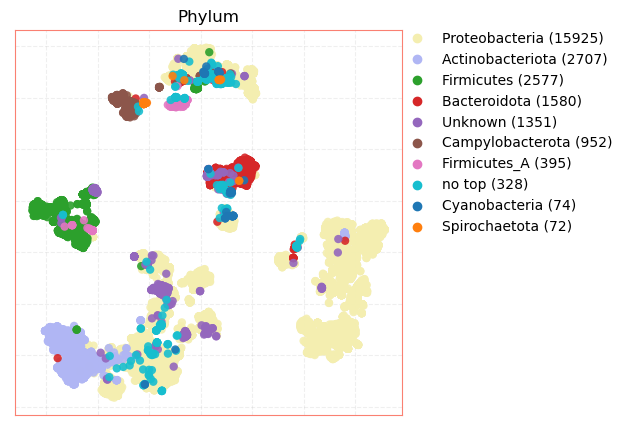

In [28]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl, "tsne1_esm1b_400", "tsne2_esm1b_400", "Phylum", colors, 'salmon')

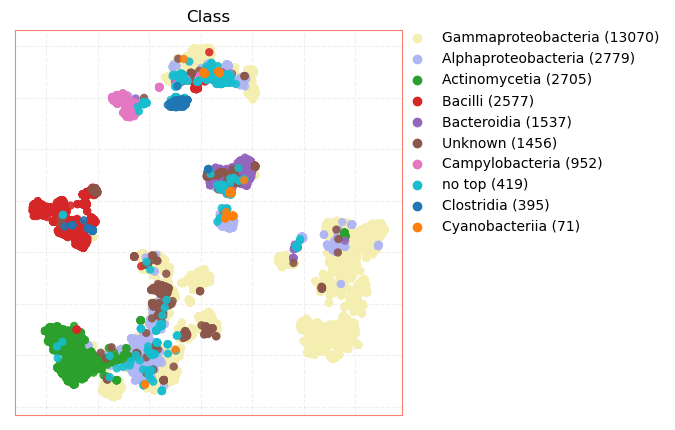

In [29]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl,  "tsne1_esm1b_400", "tsne2_esm1b_400","Class", colors, 'salmon')

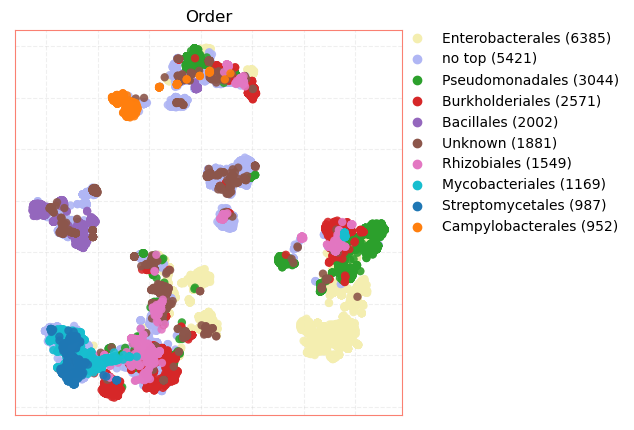

In [30]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl, "tsne1_esm1b_400", "tsne2_esm1b_400", "Order", colors, 'salmon')

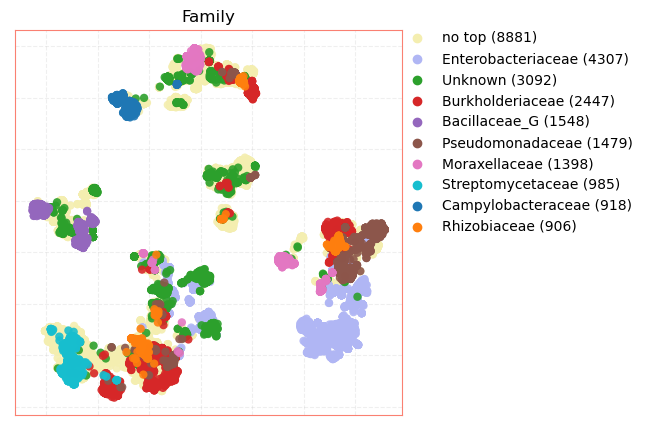

In [31]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl, "tsne1_esm1b_400", "tsne2_esm1b_400", "Family", colors, 'salmon')

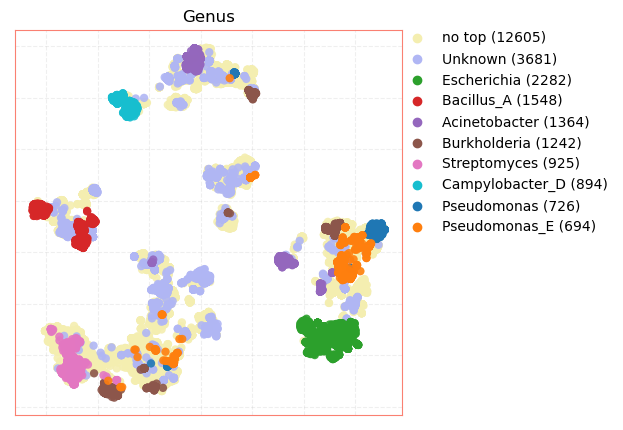

In [32]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl,"tsne1_esm1b_400", "tsne2_esm1b_400", "Genus", colors, 'salmon')

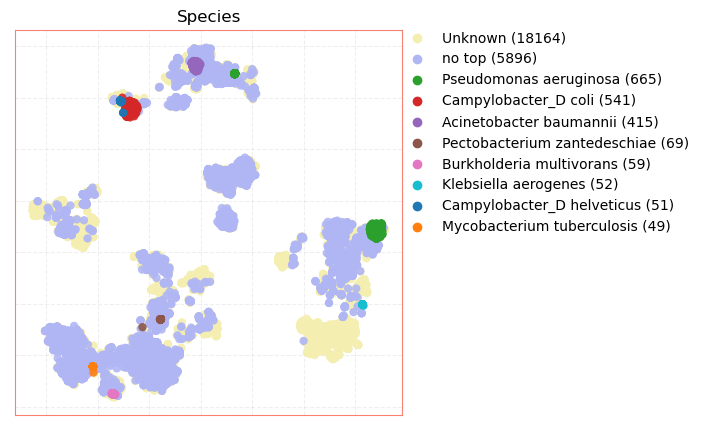

In [33]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(sbl, "tsne1_esm1b_400", "tsne2_esm1b_400","Species", colors, 'salmon')

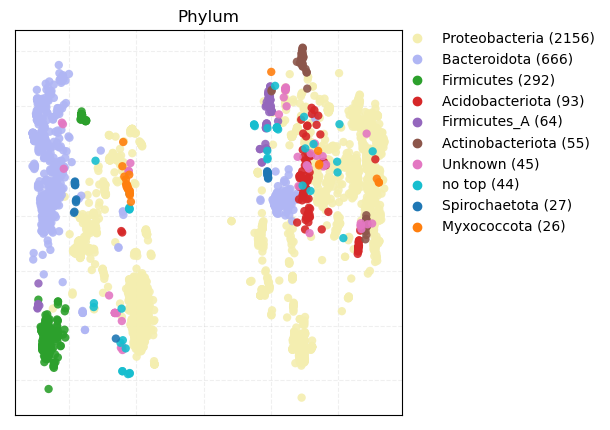

In [34]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl, "tsne1_esm1b_400", "tsne2_esm1b_400","Phylum", colors, 'k')

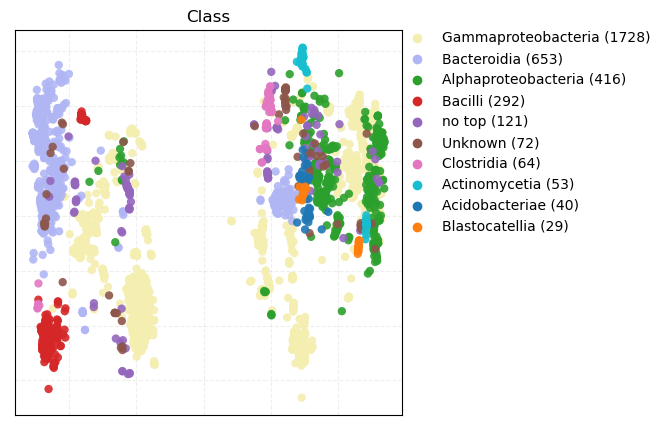

In [35]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl, "tsne1_esm1b_400", "tsne2_esm1b_400","Class", colors, 'k')

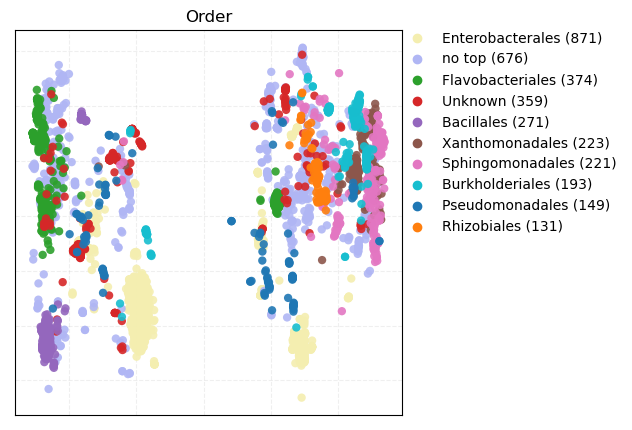

In [36]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl, "tsne1_esm1b_400", "tsne2_esm1b_400","Order", colors, 'k')

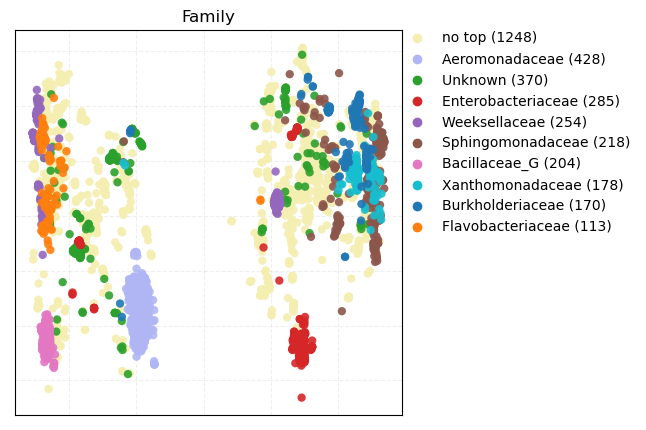

In [37]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl,"tsne1_esm1b_400", "tsne2_esm1b_400", "Family", colors, 'k')

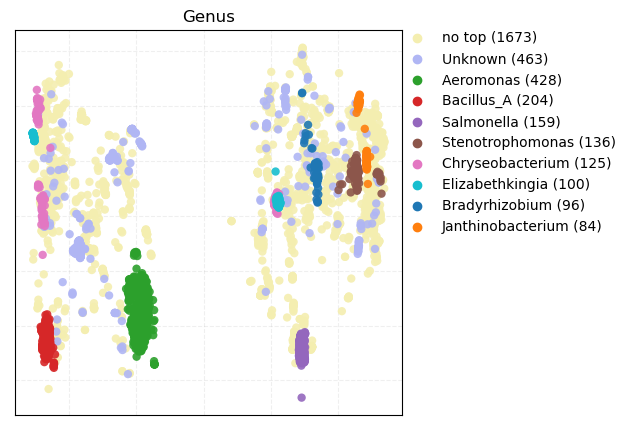

In [38]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl,"tsne1_esm1b_400", "tsne2_esm1b_400", "Genus", colors, 'k')

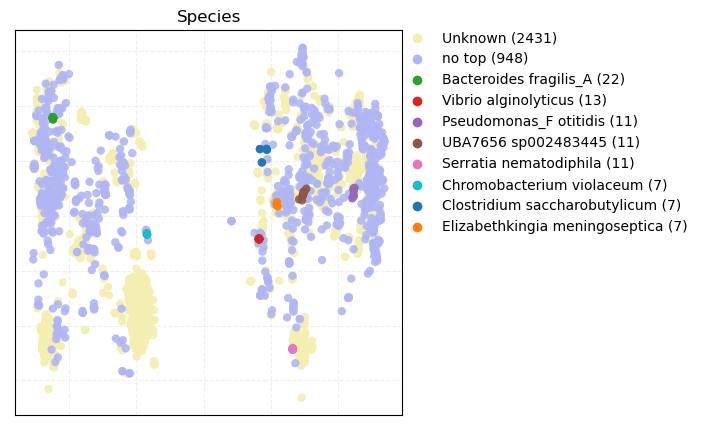

In [39]:
colors = [
        '#F4EEB0',  # pale yellow
        '#b0b6f4',  # complementary
        '#2ca02c',  # green
        '#d62728',  # red
        '#9467bd',  # purple
        '#8c564b',  # brown
        '#e377c2',  # pink
        '#17becf',  # cyan
        '#1f77b4',  # blue
        '#ff7f0e'   # orange    
]

custom_plot(mbl, "tsne1_esm1b_400", "tsne2_esm1b_400","Species", colors, 'k')

In [6]:
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

def get_top_taxa(data, col):
    
    # get the 9 most abundant taxa and rename the remaining as  other 
    top = data[col].value_counts().nlargest(9).index
    data[col] = data[col].apply(lambda x: x if x in top else "Other")
    
    return data
    
sbl_copy = sbl.copy()
mbl_copy = mbl.copy()

for taxa in taxa_lst:
    get_top_taxa(sbl_copy, taxa)

for taxa in taxa_lst:
    get_top_taxa(mbl_copy, taxa)

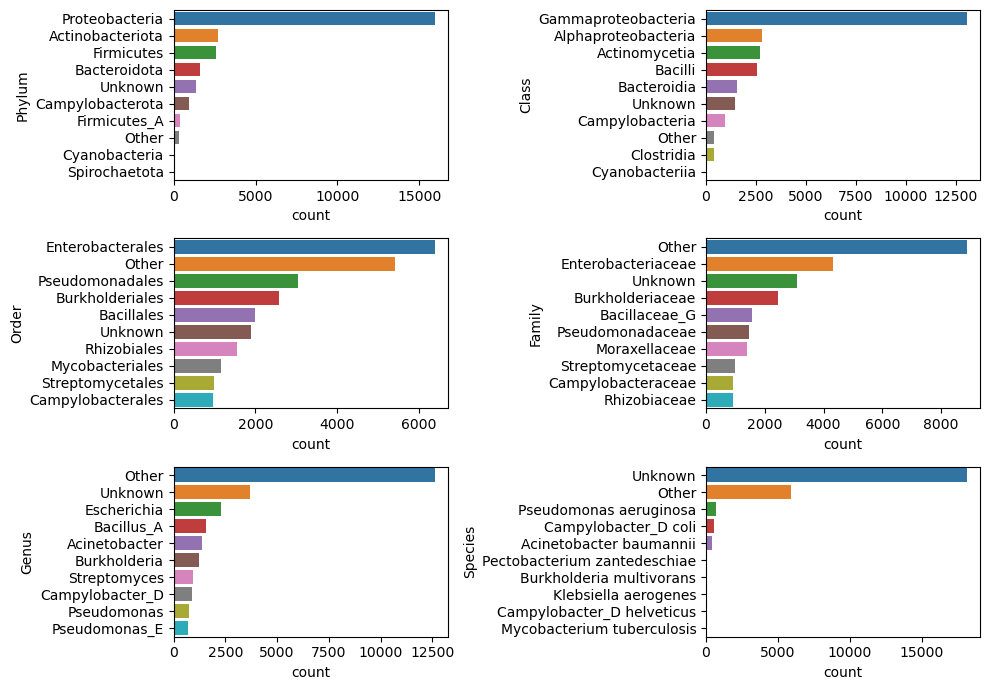

In [8]:
fig, axes = plt.subplots(3, 2, figsize=(10, 7))

for i, taxa in enumerate(taxa_lst):
    sns.countplot(sbl_copy, y=taxa, order=sbl_copy[taxa].value_counts().index, ax=axes[i//2, i%2])

plt.tight_layout()
plt.show()

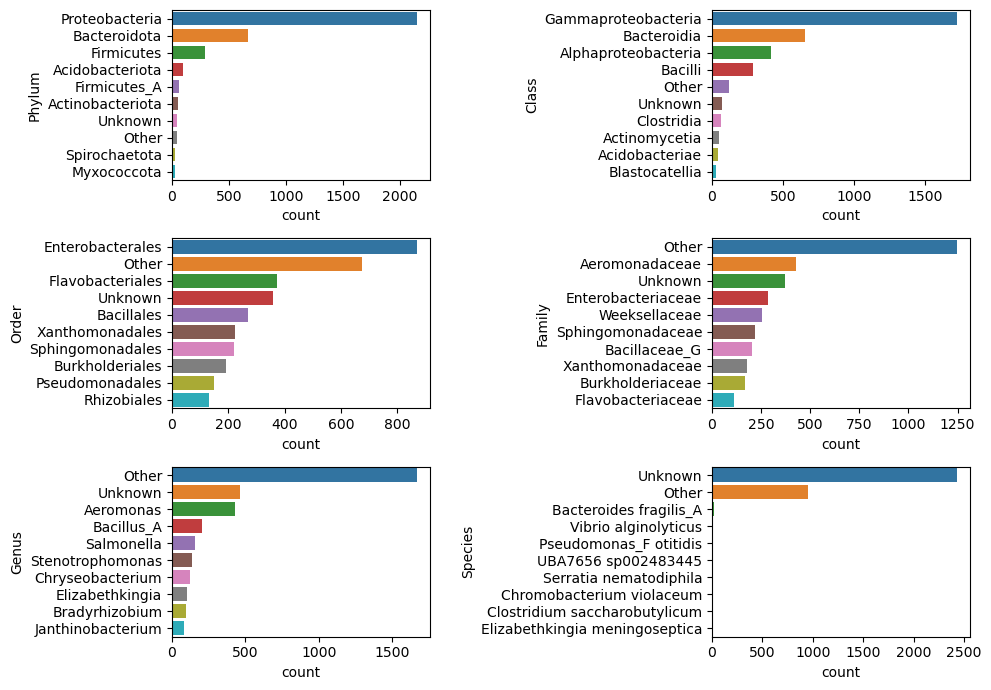

In [9]:
fig, axes = plt.subplots(3, 2, figsize=(10, 7))

for i, taxa in enumerate(taxa_lst):
    sns.countplot(mbl_copy, y=taxa, order=mbl_copy[taxa].value_counts().index, ax=axes[i//2, i%2])

plt.tight_layout()
plt.show()

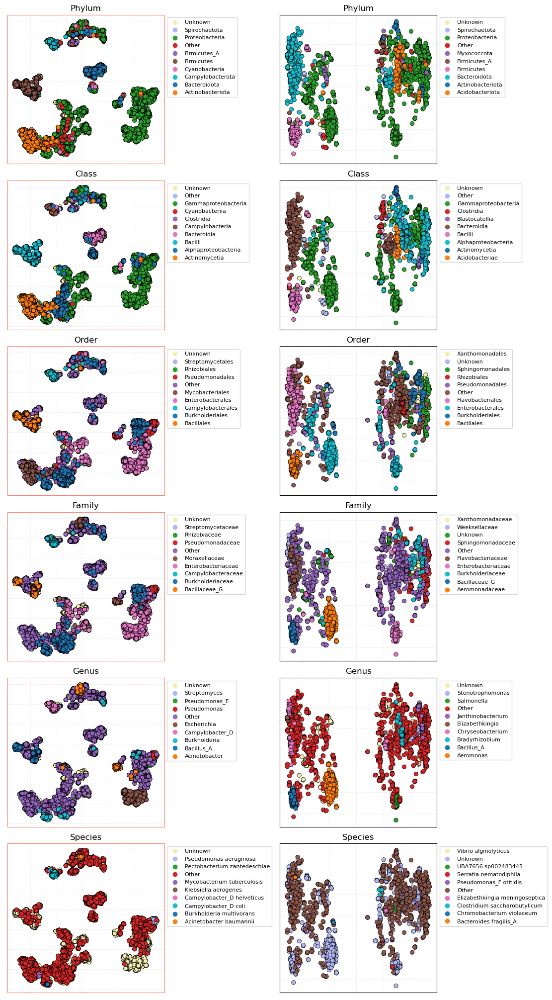

In [11]:
mosaic = """
    AG
    BH
    CI
    DJ
    EK
    FL
"""

x="tsne1_esm1b_400"
y="tsne2_esm1b_400"


ax = plt.figure(figsize=(11,20), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(sbl_copy.sort_values('Phylum', ascending=False)  , x=x, y=y, hue='Phylum' ,palette=colors, edgecolor="k", ax=ax["A"])
sns.scatterplot(sbl_copy.sort_values('Class', ascending=False)   , x=x, y=y, hue='Class'  ,palette=colors, edgecolor="k", ax=ax["B"])
sns.scatterplot(sbl_copy.sort_values('Order', ascending=False)   , x=x, y=y, hue='Order'  ,palette=colors, edgecolor="k", ax=ax["C"])
sns.scatterplot(sbl_copy.sort_values('Family', ascending=False)  , x=x, y=y, hue='Family' ,palette=colors, edgecolor="k", ax=ax["D"])
sns.scatterplot(sbl_copy.sort_values('Genus', ascending=False)   , x=x, y=y, hue='Genus'  ,palette=colors, edgecolor="k", ax=ax["E"])
sns.scatterplot(sbl_copy.sort_values('Species', ascending=False) , x=x, y=y, hue='Species',palette=colors, edgecolor="k", ax=ax["F"])
sns.scatterplot(mbl_copy.sort_values('Phylum', ascending=False)  , x=x, y=y, hue='Phylum' ,palette=colors, edgecolor="k", ax=ax["G"])
sns.scatterplot(mbl_copy.sort_values('Class', ascending=False)   , x=x, y=y, hue='Class'  ,palette=colors, edgecolor="k", ax=ax["H"])
sns.scatterplot(mbl_copy.sort_values('Order', ascending=False)   , x=x, y=y, hue='Order'  ,palette=colors, edgecolor="k", ax=ax["I"])
sns.scatterplot(mbl_copy.sort_values('Family', ascending=False)  , x=x, y=y, hue='Family' ,palette=colors, edgecolor="k", ax=ax["J"])
sns.scatterplot(mbl_copy.sort_values('Genus', ascending=False)   , x=x, y=y, hue='Genus'  ,palette=colors, edgecolor="k", ax=ax["K"])
sns.scatterplot(mbl_copy.sort_values('Species', ascending=False) , x=x, y=y, hue='Species',palette=colors, edgecolor="k", ax=ax["L"])
    
ax["A"].set_title('Phylum')
ax["B"].set_title('Class')
ax["C"].set_title('Order')
ax["D"].set_title('Family')
ax["E"].set_title('Genus')
ax["F"].set_title('Species')
ax["G"].set_title('Phylum')
ax["H"].set_title('Class')
ax["I"].set_title('Order')
ax["J"].set_title('Family')
ax["K"].set_title('Genus')
ax["L"].set_title('Species')

for i in "ABCDEFGHIJKL":
    ax[i].grid(alpha=0.2, linestyle="--")
    ax[i].set_yticklabels([])
    ax[i].set_xticklabels([])
    ax[i].set_ylabel("")
    ax[i].set_xlabel("")
    ax[i].tick_params(axis='both', colors='white')
    ax[i].set_axisbelow(True)
    ax[i].legend(frameon=True, fontsize=8, bbox_to_anchor=(1, 1), loc='upper left')
    
    if i in "ABCDEF":
        ax[i].tick_params(color='white', labelcolor='white')
        for spine in ax[i].spines.values():
            spine.set_edgecolor('salmon')
    else: 
        ax[i].tick_params(color='white', labelcolor='white')
        for spine in ax[i].spines.values():
            spine.set_edgecolor('black')
    
#plt.suptitle("Serin-betalactamases with ESM1b",fontsize=20);

In [64]:
def sort_df(data, column):
    
    frequencies = data[column].value_counts().reset_index()
    frequencies.columns = [column, 'frequency']

    
    data_with_counts = data.merge(frequencies, on=column)
    data_with_counts[column] = data_with_counts[column] + " (" + data_with_counts['frequency'].astype(str) + ")"

    
    sorted_df = data_with_counts.sort_values('frequency', ascending=False)

    return sorted_df.drop('frequency', axis=1)
    
sbl_copy_p = sort_df(sbl_copy, 'Phylum')
sbl_copy_c = sort_df(sbl_copy, 'Class')
sbl_copy_o = sort_df(sbl_copy, 'Order')
sbl_copy_f = sort_df(sbl_copy, 'Family')
sbl_copy_g = sort_df(sbl_copy, 'Genus')
sbl_copy_s = sort_df(sbl_copy, 'Species')

mbl_copy_p = sort_df(mbl_copy, 'Phylum')
mbl_copy_c = sort_df(mbl_copy, 'Class')
mbl_copy_o = sort_df(mbl_copy, 'Order')
mbl_copy_f = sort_df(mbl_copy, 'Family')
mbl_copy_g = sort_df(mbl_copy, 'Genus')
mbl_copy_s = sort_df(mbl_copy, 'Species')

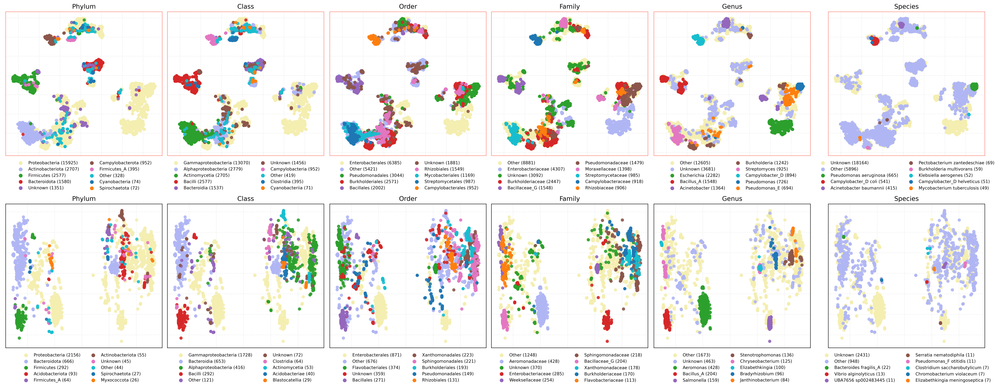

In [66]:
mosaic = """
    ABCDEF
    GHIJKL
"""

ax = plt.figure(figsize=(26,10), constrained_layout = True, dpi=400).subplot_mosaic(mosaic) 

sns.scatterplot(sbl_copy_p, x=x, y=y, hue='Phylum' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["A"])
sns.scatterplot(sbl_copy_c, x=x, y=y, hue='Class'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["B"])
sns.scatterplot(sbl_copy_o, x=x, y=y, hue='Order'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["C"])
sns.scatterplot(sbl_copy_f, x=x, y=y, hue='Family' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["D"])
sns.scatterplot(sbl_copy_g, x=x, y=y, hue='Genus'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["E"])
sns.scatterplot(sbl_copy_s, x=x, y=y, hue='Species',palette=colors, edgecolor="none", alpha=0.9, ax=ax["F"])
sns.scatterplot(mbl_copy_p, x=x, y=y, hue='Phylum' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["G"])
sns.scatterplot(mbl_copy_c, x=x, y=y, hue='Class'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["H"])
sns.scatterplot(mbl_copy_o, x=x, y=y, hue='Order'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["I"])
sns.scatterplot(mbl_copy_f, x=x, y=y, hue='Family' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["J"])
sns.scatterplot(mbl_copy_g, x=x, y=y, hue='Genus'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["K"])
sns.scatterplot(mbl_copy_s, x=x, y=y, hue='Species',palette=colors, edgecolor="none", alpha=0.9, ax=ax["L"])
    
ax["A"].set_title('Phylum')
ax["B"].set_title('Class')
ax["C"].set_title('Order')
ax["D"].set_title('Family')
ax["E"].set_title('Genus')
ax["F"].set_title('Species')
ax["G"].set_title('Phylum')
ax["H"].set_title('Class')
ax["I"].set_title('Order')
ax["J"].set_title('Family')
ax["K"].set_title('Genus')
ax["L"].set_title('Species')

for i in "ABCDEFGHIJKL":
    ax[i].grid(alpha=0.2, linestyle="--")
    ax[i].set_yticklabels([])
    ax[i].set_xticklabels([])
    ax[i].set_ylabel("")
    ax[i].set_xlabel("")
    ax[i].tick_params(axis='both', colors='white')
    ax[i].set_axisbelow(True)
    ax[i].legend(frameon=False, fontsize=8, ncols=2,loc='upper center', bbox_to_anchor=(0.5, -0.01))
    
    if i in "ABCDEF":
        ax[i].tick_params(color='white', labelcolor='white')
        for spine in ax[i].spines.values():
            spine.set_edgecolor('salmon')
    else: 
        ax[i].tick_params(color='white', labelcolor='white')
        for spine in ax[i].spines.values():
            spine.set_edgecolor('black')

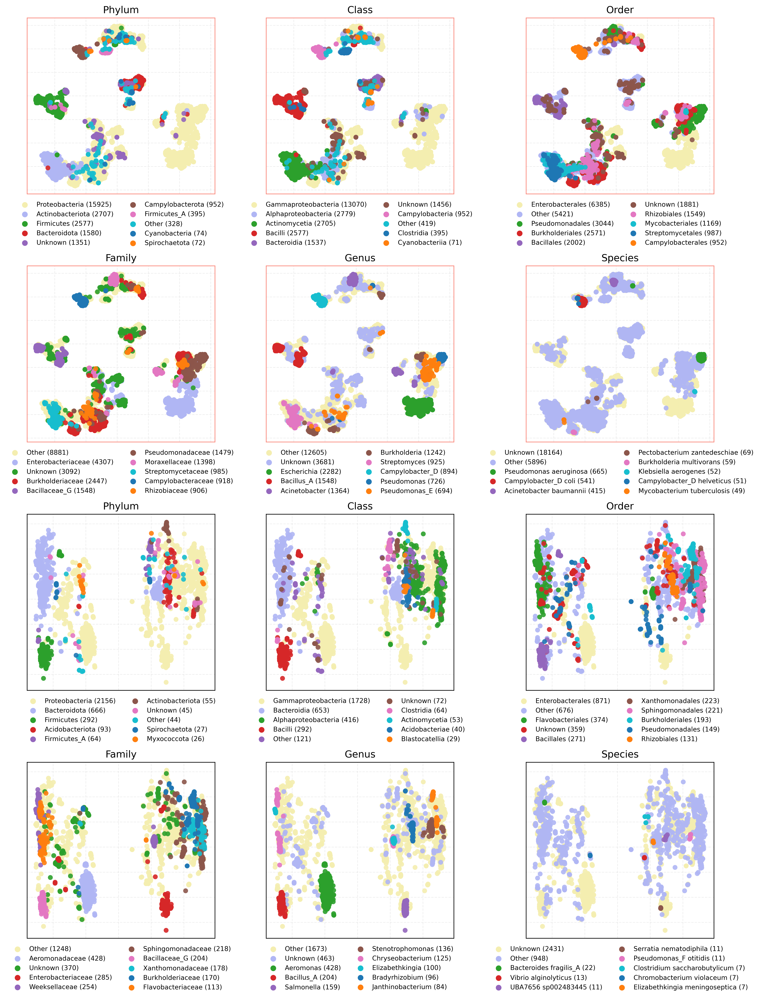

In [109]:
mosaic = """
    ABC
    DEF
    GHI
    JKL
"""

ax = plt.figure(figsize=(13, 17), constrained_layout = True, dpi=400).subplot_mosaic(mosaic) 

sns.scatterplot(sbl_copy_p, x=x, y=y, hue='Phylum' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["A"])
sns.scatterplot(sbl_copy_c, x=x, y=y, hue='Class'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["B"])
sns.scatterplot(sbl_copy_o, x=x, y=y, hue='Order'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["C"])
sns.scatterplot(sbl_copy_f, x=x, y=y, hue='Family' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["D"])
sns.scatterplot(sbl_copy_g, x=x, y=y, hue='Genus'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["E"])
sns.scatterplot(sbl_copy_s, x=x, y=y, hue='Species',palette=colors, edgecolor="none", alpha=0.9, ax=ax["F"])
sns.scatterplot(mbl_copy_p, x=x, y=y, hue='Phylum' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["G"])
sns.scatterplot(mbl_copy_c, x=x, y=y, hue='Class'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["H"])
sns.scatterplot(mbl_copy_o, x=x, y=y, hue='Order'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["I"])
sns.scatterplot(mbl_copy_f, x=x, y=y, hue='Family' ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["J"])
sns.scatterplot(mbl_copy_g, x=x, y=y, hue='Genus'  ,palette=colors, edgecolor="none", alpha=0.9, ax=ax["K"])
sns.scatterplot(mbl_copy_s, x=x, y=y, hue='Species',palette=colors, edgecolor="none", alpha=0.9, ax=ax["L"])
    
ax["A"].set_title('Phylum')
ax["B"].set_title('Class')
ax["C"].set_title('Order')
ax["D"].set_title('Family')
ax["E"].set_title('Genus')
ax["F"].set_title('Species')
ax["G"].set_title('Phylum')
ax["H"].set_title('Class')
ax["I"].set_title('Order')
ax["J"].set_title('Family')
ax["K"].set_title('Genus')
ax["L"].set_title('Species')

for i in "ABCDEFGHIJKL":
    ax[i].grid(alpha=0.2, linestyle="--")
    ax[i].set_yticklabels([])
    ax[i].set_xticklabels([])
    ax[i].set_ylabel("")
    ax[i].set_xlabel("")
    ax[i].tick_params(axis='both', colors='white')
    ax[i].set_axisbelow(True)
    ax[i].legend(frameon=False, fontsize=8, ncols=2,loc='upper center', bbox_to_anchor=(0.5, -0.01))
    
    if i in "ABCDEF":
        ax[i].tick_params(color='white', labelcolor='white')
        for spine in ax[i].spines.values():
            spine.set_edgecolor('salmon')
    else: 
        ax[i].tick_params(color='white', labelcolor='white')
        for spine in ax[i].spines.values():
            spine.set_edgecolor('black')